### Bag-of-Words

In [ ]:
!pip install gensim

In [ ]:
import gensim
import gensim.downloader as api
from gensim import corpora
from gensim.models import TfidfModel
import numpy as np
from pprint import pprint

In [ ]:
# Данные для примера
documents = [
    "кошка сидит на ковре",
    "собака бегает по двору",
    "кошка играет с собакой",
    "птица летит высоко в небе",
    "собака и кошка дружат"
]

print("Исходные документы:")
for i, doc in enumerate(documents, 1):
    print(f"{i}. {doc}")

Исходные документы:
1. кошка сидит на ковре
2. собака бегает по двору
3. кошка играет с собакой
4. птица летит высоко в небе
5. собака и кошка дружат


In [ ]:
# Токенизация
tokenized_docs = [doc.lower().split() for doc in documents]
print("Токенизированные документы:")
pprint(tokenized_docs)

Токенизированные документы:
[['кошка', 'сидит', 'на', 'ковре'],
 ['собака', 'бегает', 'по', 'двору'],
 ['кошка', 'играет', 'с', 'собакой'],
 ['птица', 'летит', 'высоко', 'в', 'небе'],
 ['собака', 'и', 'кошка', 'дружат']]


In [ ]:
# Создание словаря
dictionary = corpora.Dictionary(tokenized_docs)
print(f"Словарь: {dictionary.token2id}")

Словарь: {'ковре': 0, 'кошка': 1, 'на': 2, 'сидит': 3, 'бегает': 4, 'двору': 5, 'по': 6, 'собака': 7, 'играет': 8, 'с': 9, 'собакой': 10, 'в': 11, 'высоко': 12, 'летит': 13, 'небе': 14, 'птица': 15, 'дружат': 16, 'и': 17}


In [ ]:
dictionary.token2id

{'ковре': 0,
 'кошка': 1,
 'на': 2,
 'сидит': 3,
 'бегает': 4,
 'двору': 5,
 'по': 6,
 'собака': 7,
 'играет': 8,
 'с': 9,
 'собакой': 10,
 'в': 11,
 'высоко': 12,
 'летит': 13,
 'небе': 14,
 'птица': 15,
 'дружат': 16,
 'и': 17}

In [ ]:
# Создание Bag-of-Words представления
bow_corpus = [dictionary.doc2bow(doc) for doc in tokenized_docs]
print("Bag-of-Words векторы (индекс_слова: частота):")
for i, doc_vec in enumerate(bow_corpus, 1):
    print(f"Документ {i}: {doc_vec}")

Bag-of-Words векторы (индекс_слова: частота):
Документ 1: [(0, 1), (1, 1), (2, 1), (3, 1)]
Документ 2: [(4, 1), (5, 1), (6, 1), (7, 1)]
Документ 3: [(1, 1), (8, 1), (9, 1), (10, 1)]
Документ 4: [(11, 1), (12, 1), (13, 1), (14, 1), (15, 1)]
Документ 5: [(1, 1), (7, 1), (16, 1), (17, 1)]


```
[['кошка', 'сидит', 'на', 'ковре'],
 ['собака', 'бегает', 'по', 'двору'],
 ['кошка', 'играет', 'с', 'собакой'],
 ['птица', 'летит', 'высоко', 'в', 'небе'],
 ['собака', 'и', 'кошка', 'дружат']]
 ```

```
Словарь: {'ковре': 0, 'кошка': 1, 'на': 2, 'сидит': 3, 'бегает': 4, 'двору': 5, 'по': 6, 'собака': 7, 'играет': 8, 'с': 9, 'собакой': 10, 'в': 11, 'высоко': 12, 'летит': 13, 'небе': 14, 'птица': 15, 'дружат': 16, 'и': 17}
```

In [ ]:
# Преобразование в плотные векторы для визуализации
def bow_to_dense(bow_corpus, dictionary):
    dense_vectors = []
    for doc in bow_corpus:
        dense_vec = [0] * len(dictionary)
        for idx, freq in doc:
            dense_vec[idx] = freq
        dense_vectors.append(dense_vec)
    return dense_vectors

dense_vectors = bow_to_dense(bow_corpus, dictionary)
print("Плотные векторы Bag-of-Words:")
print("Слова:", list(dictionary.token2id.keys()))
for i, vec in enumerate(dense_vectors, 1):
    print(f"Док {i}: {vec}")

Плотные векторы Bag-of-Words:
Слова: ['ковре', 'кошка', 'на', 'сидит', 'бегает', 'двору', 'по', 'собака', 'играет', 'с', 'собакой', 'в', 'высоко', 'летит', 'небе', 'птица', 'дружат', 'и']
Док 1: [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Док 2: [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Док 3: [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]
Док 4: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0]
Док 5: [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]


```
Документ 1: [(0, 1), (1, 1), (2, 1), (3, 1)]
Документ 2: [(4, 1), (5, 1), (6, 1), (7, 1)]
Документ 3: [(1, 1), (8, 1), (9, 1), (10, 1)]
Документ 4: [(11, 1), (12, 1), (13, 1), (14, 1), (15, 1)]
Документ 5: [(1, 1), (7, 1), (16, 1), (17, 1)]
```

Matrix shape: (5, 18)


Text(0.5, 36.72222222222221, 'Words')

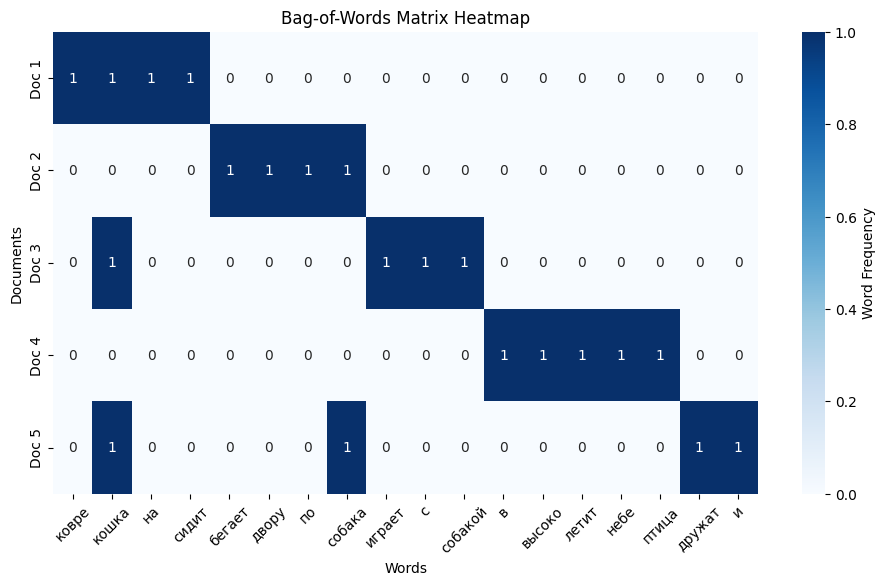

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Визуализация
matrix = np.array(dense_vectors)
words = list(dictionary.token2id.keys())
doc_names = [f"Doc {i+1}" for i in range(len(documents))]

print(f"Matrix shape: {matrix.shape}")

plt.figure(figsize=(25, 6))

plt.subplot(1, 2, 1)
sns.heatmap(matrix,
            annot=True,
            fmt='d',
            xticklabels=words,
            yticklabels=doc_names,
            cmap='Blues',
            cbar_kws={'label': 'Word Frequency'})
plt.title('Bag-of-Words Matrix Heatmap')
plt.xticks(rotation=45)
plt.ylabel('Documents')
plt.xlabel('Words')


### TF-IDF

In [ ]:
tfidf_model = TfidfModel(bow_corpus)
tfidf_corpus = tfidf_model[bow_corpus]

print("TF-IDF векторы (индекс_слова: tfidf_вес):")
for i, doc_vec in enumerate(tfidf_corpus, 1):
    print(f"Документ {i}: {[(dictionary[idx], round(score, 3)) for idx, score in doc_vec]}")

TF-IDF векторы (индекс_слова: tfidf_вес):
Документ 1: [('ковре', np.float64(0.568)), ('кошка', np.float64(0.18)), ('на', np.float64(0.568)), ('сидит', np.float64(0.568))]
Документ 2: [('бегает', np.float64(0.548)), ('двору', np.float64(0.548)), ('по', np.float64(0.548)), ('собака', np.float64(0.312))]
Документ 3: [('кошка', np.float64(0.18)), ('играет', np.float64(0.568)), ('с', np.float64(0.568)), ('собакой', np.float64(0.568))]
Документ 4: [('в', np.float64(0.447)), ('высоко', np.float64(0.447)), ('летит', np.float64(0.447)), ('небе', np.float64(0.447)), ('птица', np.float64(0.447))]
Документ 5: [('кошка', np.float64(0.204)), ('собака', np.float64(0.366)), ('дружат', np.float64(0.642)), ('и', np.float64(0.642))]


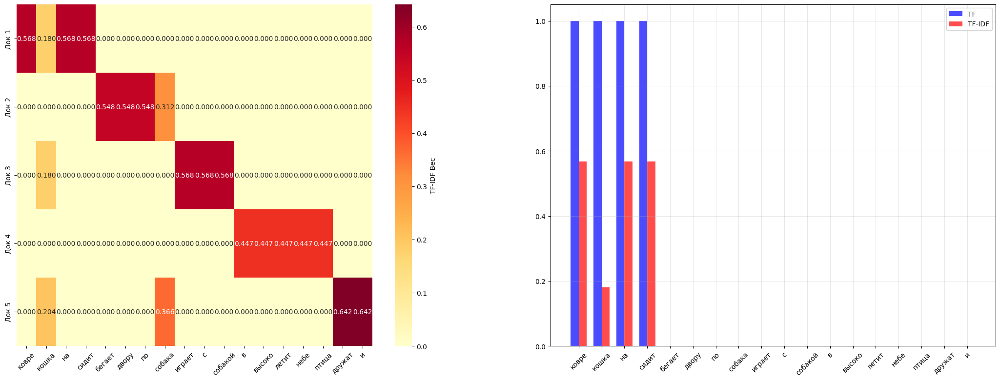

In [ ]:
# Преобразуем TF-IDF в плотную матрицу для визуализации
def tfidf_to_dense(tfidf_corpus, dictionary):
    dense_vectors = []
    for doc in tfidf_corpus:
        dense_vec = [0.0] * len(dictionary)
        for idx, score in doc:
            dense_vec[idx] = score
        dense_vectors.append(dense_vec)
    return dense_vectors

tfidf_dense = tfidf_to_dense(tfidf_corpus, dictionary)
tfidf_matrix = np.array(tfidf_dense)
words = list(dictionary.token2id.keys())
doc_names = [f"Док {i+1}" for i in range(len(tfidf_corpus))]

plt.figure(figsize=(40, 20))

plt.subplot(2, 3, 1)
sns.heatmap(tfidf_matrix,
            annot=True,
            fmt='.3f',
            xticklabels=words,
            yticklabels=doc_names,
            cmap='YlOrRd',
            cbar_kws={'label': 'TF-IDF Вес'})
plt.xticks(rotation=45)

plt.subplot(2, 3, 2)
# Получаем исходные TF значения из bow_corpus
tf_dense = bow_to_dense(bow_corpus, dictionary)
tf_matrix = np.array(tf_dense)

# Сравниваем TF и TF-IDF для первого документа
doc_idx = 0
x_pos = np.arange(len(words))
width = 0.35

plt.bar(x_pos - width/2, tf_matrix[doc_idx], width, label='TF', alpha=0.7, color='blue')
plt.bar(x_pos + width/2, tfidf_matrix[doc_idx], width, label='TF-IDF', alpha=0.7, color='red')
plt.xticks(x_pos, words, rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)

#### **1. TF (Term Frequency) - Частота термина**
```python
TF(t,d) = count(t,d) / total_terms(d)
```
или упрощенно:
```python
TF(t,d) = count(t,d)  # просто количество вхождений
```

#### **2. IDF (Inverse Document Frequency) - Обратная частота документа**
```python
IDF(t) = log( N / (DF(t) + 1) ) + 1
```
Где:
- **N** - общее количество документов
- **DF(t)** - количество документов, содержащих слово t
- **+1** в знаменателе - сглаживание, чтобы не было "околонулевых" значений (smoothing)
- **+1** в конце - для избежания нулевых весов

#### **3. TF-IDF - итоговый вес**
```python
TF-IDF(t,d) = TF(t,d) × IDF(t)
```

**Сравнение разных формул IDF**

| Формула | Редкое слово (DF=1) | Частое слово (DF=100) | Сверхчастое (DF=990) |
|---------|---------------------|----------------------|---------------------|
| `log(N/DF)` | 6.91 | 2.30 | 0.01 |
| `log(N/(DF+1))` | 6.90 | 2.29 | 0.009 |
| `log(N/(DF+1)) + 1` | **7.90** | **3.29** | **1.009** |


### Word2Vec

In [ ]:
# Используем небольшую модель для демонстрации
print("Загрузка предобученной модели Word2Vec...")
w2v_model = api.load("glove-wiki-gigaword-50")  # Маленькая модель

# Функция для получения эмбеддинга документа
def get_doc_embedding(tokens, model):
    word_vectors = []
    for token in tokens:
        try:
            word_vectors.append(model[token])
        except KeyError:
            continue
    if word_vectors:
        return np.mean(word_vectors, axis=0)
    else:
        return np.zeros(model.vector_size)

# Получаем эмбеддинги для документов
doc_embeddings = []
for i, tokens in enumerate(tokenized_docs):
    embedding = get_doc_embedding(tokens, w2v_model)
    doc_embeddings.append(embedding)
    print(f"\nДокумент {i+1}: {documents[i]}")
    print(f"Эмбеддинг (первые 10 значений): {embedding[:10].round(4)}")
    print(f"Размер: {embedding.shape}")

# Косинусная схожесть между документами
from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(doc_embeddings)
print("\nМатрица косинусной схожести:")
print("     Д1    Д2    Д3    Д4    Д5")
for i, row in enumerate(similarity_matrix):
    print(f"Д{i+1}  " + "  ".join([f"{x:.3f}" for x in row]))

Загрузка предобученной модели Word2Vec...
[==================================================] 100.0% 66.0/66.0MB downloaded

Документ 1: кошка сидит на ковре
Эмбеддинг (первые 10 значений): [-1.3191  1.5595  0.0702 -0.4633 -0.8065  0.3126  1.2403 -0.6641 -1.1753
 -0.4418]
Размер: (50,)

Документ 2: собака бегает по двору
Эмбеддинг (первые 10 значений): [-1.1564  0.7363 -0.162  -0.0846 -0.9603  0.3709  1.9096  0.0091 -0.388
 -0.8261]
Размер: (50,)

Документ 3: кошка играет с собакой
Эмбеддинг (первые 10 значений): [-1.5624  0.9866  0.1836 -1.0273 -0.8551 -0.0476  1.141  -0.6877 -0.2825
 -0.7102]
Размер: (50,)

Документ 4: птица летит высоко в небе
Эмбеддинг (первые 10 значений): [-1.0499  1.3412 -0.3431 -0.8776 -1.2784  0.1292  1.812  -0.3816 -0.9911
 -0.2818]
Размер: (50,)

Документ 5: собака и кошка дружат
Эмбеддинг (первые 10 значений): [-0.9957  1.3808 -0.3036 -0.7568 -0.9025  0.2521  1.4351 -0.4907 -1.3925
 -0.1646]
Размер: (50,)

Матрица косинусной схожести:
     Д1    Д2    Д3  

*Как работает Word2Vec мы разберем на следующей лекции..*

### Домашка

1. Скачать [датасет по ссылке](https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv) (просто запустить строку ниже)

In [2]:
!wget https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv

--2025-11-07 15:08:55--  https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102826 (100K) [text/plain]
Saving to: ‘test.csv’

test.csv            100%[===================>] 100.42K  --.-KB/s    in 0.006s  

2025-11-07 15:08:55 (16.7 MB/s) - ‘test.csv’ saved [102826/102826]



2. Открыть csv и сохранить текст в переменную (макс. балл == 1)

In [3]:
import pandas as pd #импортирую необходимое для работы
import numpy as np
df = pd.read_csv('test.csv', encoding ='utf-8-sig') #открываю файл
c_t = list(df['text']) #сохраняю текст в переменную в виде списка
#print(c_t) #проверяю, что текст сохранился корректно

3. Извлечь столбец с текстами (макс. балл == 1)

In [4]:
st = df['text'] #сохраняю столбец с текстами в новую переменную
#print(st) #проверяю


4. Построить Bag-of-Words (макс. балл == 3)

In [5]:
!pip install gensim #импортирую необходимое для работы
import gensim
import gensim.downloader as api
from gensim import corpora
from gensim.models import TfidfModel
import numpy as np
from pprint import pprint
import re

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 58.2 MB/s eta 0:00:00


In [6]:
# Задача 1.1: Создайте словарь и BoW представление (макс. балл == 2)

cleaned_t = [] #создаю пустой список для чистого текста
for s in st: #для каждого предложения в столбце
  s_l = re.sub(r'[^a-zA-Z ]', ' ', s) #заменяю все кроме букв и пробелов на пробел
  s_l = re.sub(r'\s+', ' ', s) #заменяю лишние пробелы на один пробел
  cleaned_t. append(s_l) #добавляю чистые предложение в список
#print(cleaned_t) #проверяю

# - Приведите тексты к нижнему регистру
tokenized_ct = [doc.lower().split() for doc in cleaned_t] #привожу к нижнему регистру и удаляю знаки препинания
#print(tokenized_ct) #проверяю

# - Постройте словарь
dictionary = corpora.Dictionary(tokenized_ct) #создаю словарь и записываю в него токены
print(dictionary.token2id)

# - Преобразуйте документы в BoW векторы
bow_corpus = [dictionary.doc2bow(doc) for doc in tokenized_ct]
for i, doc_vec in enumerate(bow_corpus, 1): #для каждого предложения вывожу BOF-представление
  print(f"Документ {i}:{doc_vec}")



{'#caveman': 0, 'a': 1, 'about': 2, 'conversation': 3, 'dad': 4, 'ever': 5, 'have': 6, 'infuriating': 7, 'is': 8, 'most': 9, 'my': 10, 'pointless': 11, 'the': 12, 'thing': 13, 'to': 14, 'trying': 15, 'vegetarianism': 16, 'with': 17, '#israel': 18, '#latestnews': 19, '#nativeamerican': 20, '#newmexico': 21, '#palestine': 22, '#politics': 23, '+': 24, '-': 25, '4': 26, 'alt-right': 27, 'at...': 28, 'of': 29, 'protesting': 30, 'rise': 31, '@user': 32, 'and': 33, 'are': 34, 'gentleman': 35, 'guy': 36, 'pence': 37, 'president': 38, 'stand': 39, 'up': 40, 'vice': 41, 'you': 42, 'blocked': 43, 'by': 44, 'flynn': 45, 'he': 46, "isn't": 47, 'like': 48, 'looks': 49, 'me,': 50, 'me.': 51, 'pleased': 52, 'too': 53, '#vanessa': 54, 'clips': 55, 'efron': 56, 'hudgens': 57, 'naked': 58, 'perfect': 59, 'pussy': 60, 'zac': 61, 'but': 62, 'catholic,': 63, 'dude.': 64, 'even': 65, 'everything': 66, 'francis': 67, 'him': 68, 'hug': 69, 'i': 70, "i'm": 71, 'just': 72, 'me': 73, 'need': 74, 'not': 75, 'okay

In [7]:
import matplotlib.pyplot as plt #импортирую все необходимое
import seaborn as sns

In [8]:
# - Создайте таблицу частот слов
word_freq = {} #создаю словарь для подсчета частот
for doc in bow_corpus: #для каждого документа в bow_corpus
  for idx, freq in doc:
    word = dictionary[idx] #получаю id слова из словаря
    word_freq[word] = word_freq.get(word, 0) + freq #увеличивается счетчик слова
top_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)[:20] #сортирую слова и отбираю топ-20
print('Топ-20 самых частых слов:')
for word, freq in top_words: #для каждого слова в топе-20 вывести сам слово и его частоту
  print(f"{word}: {freq}") #самым частотным словом является user

Топ-20 самых частых слов:
@user: 570
the: 381
to: 267
a: 225
of: 199
is: 184
for: 172
in: 161
and: 160
i: 132
on: 114
you: 84
this: 74
that: 72
with: 71
it: 68
are: 62
be: 58
not: 57
&: 56


In [9]:
# Задача 1.2: Визуализируйте результаты (макс. балл == 1)
def bow_to_dense(bow_corpus, dict_ct): #определяю функцию для преобразования в матрицу
    dense_vectors = []
    for doc in bow_corpus:
        dense_vec = [0] * len(dict_ct)
        for idx, freq in doc:
            dense_vec[idx] = freq
        dense_vectors.append(dense_vec)
    return dense_vectors

dense_vectors = bow_to_dense(bow_corpus, dictionary) #применяю функцию к bow_corpus
print("Слова:", list(dictionary.token2id.keys()))
for i, vec in enumerate(dense_vectors, 1):
    print(f"Док {i}: {vec}")

Слова: ['#caveman', 'a', 'about', 'conversation', 'dad', 'ever', 'have', 'infuriating', 'is', 'most', 'my', 'pointless', 'the', 'thing', 'to', 'trying', 'vegetarianism', 'with', '#israel', '#latestnews', '#nativeamerican', '#newmexico', '#palestine', '#politics', '+', '-', '4', 'alt-right', 'at...', 'of', 'protesting', 'rise', '@user', 'and', 'are', 'gentleman', 'guy', 'pence', 'president', 'stand', 'up', 'vice', 'you', 'blocked', 'by', 'flynn', 'he', "isn't", 'like', 'looks', 'me,', 'me.', 'pleased', 'too', '#vanessa', 'clips', 'efron', 'hudgens', 'naked', 'perfect', 'pussy', 'zac', 'but', 'catholic,', 'dude.', 'even', 'everything', 'francis', 'him', 'hug', 'i', "i'm", 'just', 'me', 'need', 'not', 'okay.', 'pope', 'tell', 'al', 'america', 'as', 'crying', 'do', 'for', 'how', 'left', 'middle', 'much', 'out-they', 'power', 'twice', 'voting', 'class', 'comey', 'editorial:', 'families.', 'fbi’s', 'no', 'one', 'sentinel', '‘had', '5,', '7.0', 'android', 'bring', 'edge,', 'galaxy', 'news', '

Matrix shape: (20, 5016)


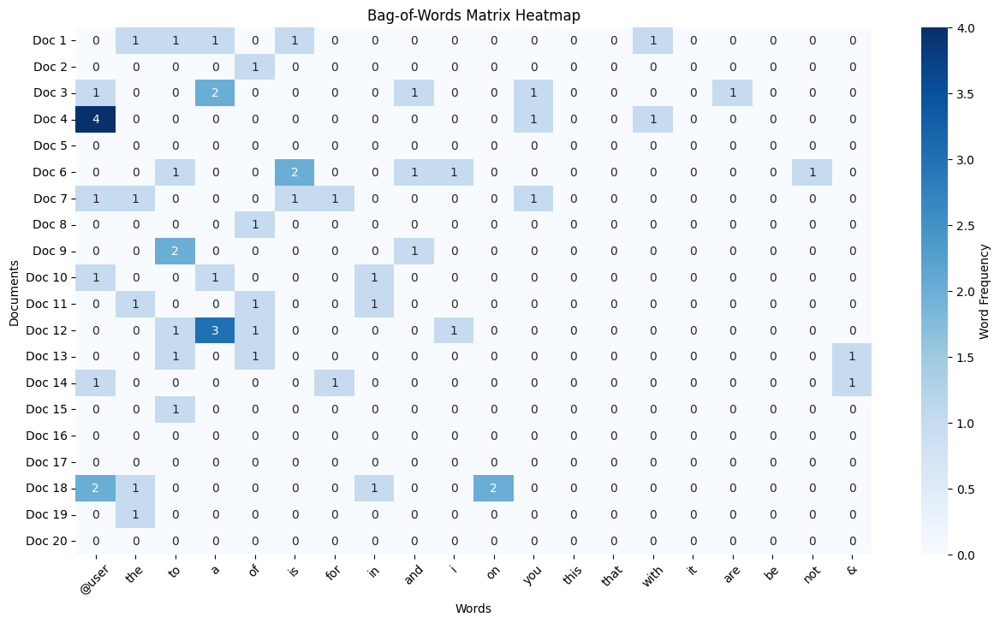

In [10]:
# - Постройте heatmap матрицы BoW
matrix = np.array(dense_vectors[:20]) #беру первые 20 документов для визуализации
words = list(dictionary.token2id.keys())[:20]
doc_names = [f"Doc {i+1}" for i in range(len(cleaned_t))]
top_word_ids = [dictionary.token2id[word] for word, _ in top_words[:20]] #получаю id первых 20 самых частотных слов для отображения в визуализации

matrix_subset = matrix[:, top_word_ids] # выбираю из матрицы только столбы с топ-словами
print(f"Matrix shape: {matrix.shape}")

plt.figure(figsize=(15, 8)) #создаю heatmap
sns.heatmap(matrix_subset,
            annot=True,
            fmt='d',
            xticklabels=[word for word, _ in top_words[:20]],
            yticklabels=[f'Doc {i+1}' for i in range(20)],
            cmap='Blues',
            cbar_kws={'label': 'Word Frequency'})
plt.title('Bag-of-Words Matrix Heatmap')
plt.xticks(rotation=45)
plt.ylabel('Documents')
plt.xlabel('Words')
plt.show()

5. Построить TF-IDF (макс. балл == 5)

In [16]:
# Задача 2.1: Примените TF-IDF к BoW представлению (макс. балл == 2)
# Использую TfidfModel из gensim
tfidf_model = TfidfModel(bow_corpus)
tfidf_corpus = tfidf_model[bow_corpus]
# - Получаю TF-IDF векторы для каждого документа
for i, doc_vec in enumerate(tfidf_corpus, 1):
    print(f"Документ {i}: {[(dictionary[idx], round(score, 3)) for idx, score in doc_vec]}")

# Задача 2.2: Проанализируйте веса TF-IDF (макс. балл == 3)
def analyze_tfidf_components(bow_corpus, dictionary): #определяю функцию для ручного подсчета
    # Создаю матрицу TF (term frequency)
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for doc_idx, doc in enumerate(bow_corpus):
        for word_idx, freq in doc:
            tf_matrix[doc_idx, word_idx] = freq
# Вычисляю DF (document frequency)
    df_vector = np.sum(tf_matrix > 0, axis=0)  # Количество документов с каждым словом
#   Вычисляю IDF (inverse document frequency)
    N = len(bow_corpus)
    idf_vector = np.log(N / (df_vector + 1)) + 1
#   Вычисляю TF-IDF
    tfidf_manual = tf_matrix * idf_vector
    return tf_matrix, df_vector, idf_vector, tfidf_manual

# - Сохраняю результат в *.сsv
tf_matrix, df_vector, idf_vector, tfidf_manual = analyze_tfidf_components(bow_corpus, dictionary) #применяю функцию
word_list = list(dictionary.values()) #получаю список слов
data = {                                    #создаю словарь для записи данных (по формату из обучающей статьи Pandas https://pandas.pydata.org/docs/user_guide/10min.html)
    'Word': word_list,
    'TF_Matrix': np.mean(tf_matrix, axis=0),
    'DF_Vector': df_vector,
    'IDF_Vector': idf_vector,
    'TF-IDF_Manual': np. mean(tfidf_manual, axis=0)
}

from google.colab import drive
drive.mount('/content/drive')

tf_idf = pd.DataFrame(data) #создание DataFrame
file_saved = '/content/drive/My Drive/analyze_tfidf'    #Воспользовалась помощью ИИ, чтобы сохранить файл на GoogleDisk и скачать
tf_idf.to_csv(file_saved, index = False) #сохранение в csv
print(tf_idf.head()) #вывод записей
# - Прикрепите *.csv в ваш репозиторий


Документ 1: [('#caveman', np.float64(0.348)), ('a', np.float64(0.079)), ('about', np.float64(0.162)), ('conversation', np.float64(0.348)), ('dad', np.float64(0.313)), ('ever', np.float64(0.256)), ('have', np.float64(0.148)), ('infuriating', np.float64(0.348)), ('is', np.float64(0.086)), ('most', np.float64(0.209)), ('my', np.float64(0.149)), ('pointless', np.float64(0.348)), ('the', np.float64(0.056)), ('thing', np.float64(0.241)), ('to', np.float64(0.069)), ('trying', np.float64(0.292)), ('vegetarianism', np.float64(0.235)), ('with', np.float64(0.132))]
Документ 2: [('#israel', np.float64(0.169)), ('#latestnews', np.float64(0.256)), ('#nativeamerican', np.float64(0.256)), ('#newmexico', np.float64(0.256)), ('#palestine', np.float64(0.183)), ('#politics', np.float64(0.23)), ('+', np.float64(0.645)), ('-', np.float64(0.123)), ('4', np.float64(0.189)), ('alt-right', np.float64(0.215)), ('at...', np.float64(0.256)), ('of', np.float64(0.06)), ('protesting', np.float64(0.23)), ('rise', np.f

##### **Как вычислить компоненты вручную**

```python
def analyze_tfidf_components(bow_corpus, dictionary):
    # Шаг 1: Создаем матрицу TF (term frequency)
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for doc_idx, doc in enumerate(bow_corpus):
        for word_idx, freq in doc:
            tf_matrix[doc_idx, word_idx] = freq
    
    # Шаг 2: Вычисляем DF (document frequency)
    df_vector = np.sum(tf_matrix > 0, axis=0)  # Количество документов с каждым словом
    
    # Шаг 3: Вычисляем IDF (inverse document frequency)
    N = len(bow_corpus)  # общее количество документов
    idf_vector = np.log(N / (df_vector + 1)) + 1
    
    # Шаг 4: Вычисляем TF-IDF вручную
    tfidf_manual = tf_matrix * idf_vector
    
    return tf_matrix, df_vector, idf_vector, tfidf_manual
```

6. Произвести сравните

*Эта часть не оценивается, но будет давать доп. баллы на экзамене для тех, кто выполнит её*

In [ ]:
# Сравните BoW и TF-IDF для конкретных слов
# - Выберите 3-4 слова из датасета (выберите слова, характерные для датасета)
# - Постройте графики сравнения их весов в BoW и TF-IDF

##### **Как построить сравнительный график**
```python
def compare_bow_tfidf(words, bow_dense, tfidf_dense, dictionary):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    for i, word in enumerate(words):
        row, col = i // 2, i % 2
        word_id = dictionary.token2id[word]
        
        # Веса для этого слова во всех документах
        bow_weights = [doc[word_id] for doc in bow_dense]
        tfidf_weights = [doc[word_id] for doc in tfidf_dense]
        
        x = range(len(bow_dense))
        axes[row, col].bar(x, bow_weights, alpha=0.7, label='BoW', width=0.4)
        axes[row, col].bar([p + 0.4 for p in x], tfidf_weights, alpha=0.7, label='TF-IDF', width=0.4)
        axes[row, col].set_title(f'Сравнение весов: "{word}"')
        axes[row, col].legend()
        axes[row, col].set_xticks([p + 0.2 for p in x])
        axes[row, col].set_xticklabels([f'Док {i+1}' for i in x])
    
    plt.tight_layout()
    plt.show()
```